In [101]:
#Лабораторная работа №1 
#Тема: Звуки и сигналы
#Студент: Танашкин Валерий Александрович 
#Группа: 3530901/80203


In [ ]:
#Импорты

In [4]:
from __future__ import print_function, division
%matplotlib inline
import thinkdsp
import thinkplot
import numpy as np
from ipywidgets import interact, interactive, fixed
import ipywidgets as widgets
from IPython.display import display

In [5]:
#1.2 
# Был выбран звук колокола, в начале не очень приятный

In [22]:
wave = thinkdsp.read_wave('bell.wav')
wave.make_audio()

In [ ]:
# Выбираем отрезок 0.5с с монотонным звуком

In [23]:
wave = wave.segment(start = 0.2, duration = 0.5)
wave.make_audio()

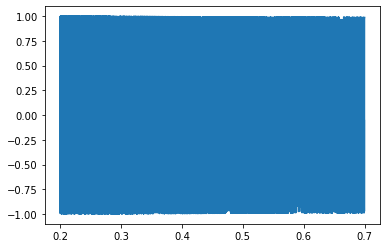

In [28]:
wave.plot()

In [ ]:
# Спектр звука

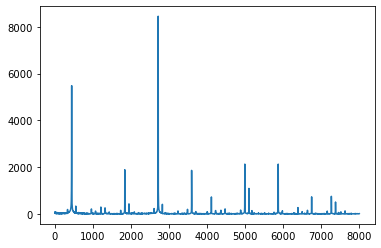

In [29]:
spectr = wave.make_spectrum()
spectr.plot(8000)

In [ ]:
# Отфильтруем гармоники

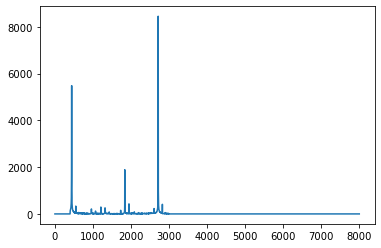

In [30]:
spectr2 = wave.make_spectrum()
spectr2.low_pass(3000)
spectr2.high_pass(400)
spectr2.plot(8000)

In [32]:
# Преобразуем спектр в сигнал и прослушаем. Звук стал немного мягче, не такой резкий

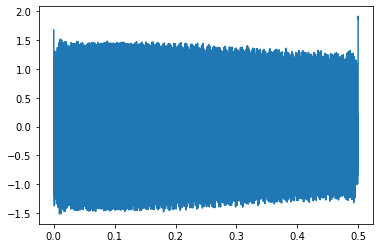

In [33]:
filtered = spectr2.make_wave()
filtered.plot()
filtered.make_audio()

In [134]:
#1.3
#Возьмем несколько сигналов(sin/cos с разными частотами):
#Частоты беру из 3-4 октавы

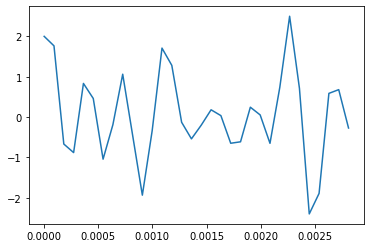

In [35]:
sin_sig_31 = thinkdsp.SinSignal(freq=1046.5, amp=0.5, offset=0)
sin_sig_45 = thinkdsp.SinSignal(freq=3136.0, amp=0.5, offset=0)
sin_sig_35 = thinkdsp.SinSignal(freq=1568.0, amp=0.5, offset=0)
cos_sig_43 = thinkdsp.CosSignal(freq=2637.0, amp=1.0, offset=0)
cos_sig_36 = thinkdsp.CosSignal(freq=1760.0, amp=1.0, offset=0)

my_mix = sin_sig_31 + sin_sig_45 + sin_sig_35 + cos_sig_43 + cos_sig_36
my_mix.plot()

wave = my_mix.make_wave(duration=3, start=0)
wave.make_audio()

In [ ]:
# Спектр

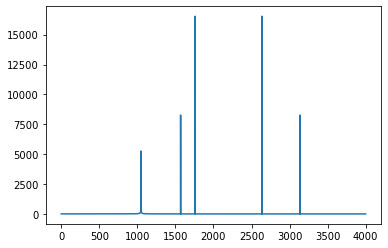

In [37]:
spectrum = wave.make_spectrum()
spectrum.plot(4000)

In [ ]:
# Добавим еще сигнал

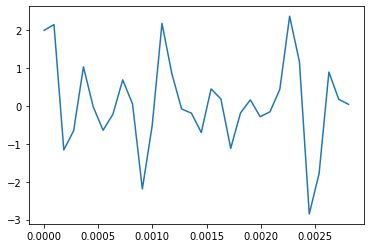

In [39]:
sin_sig_47 = thinkdsp.SinSignal(freq=3951.1, amp=0.5, offset=0)
my_mix += sin_sig_47
my_mix.plot()

In [ ]:
#Получается не приятный монотонный звук

In [40]:
wave = my_mix.make_wave(duration=3, start=0, framerate=31025)
wave.make_audio()

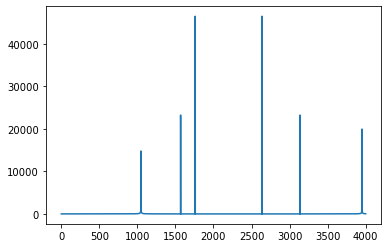

In [41]:
spectrum = wave.make_spectrum()
spectrum.plot(4000)

In [ ]:
# 1.4
# Реализация функции stretch 
# Ускоряем/замедляем наш сигнал.

In [48]:
def stretch(wave, factor):
    wave.ts *= factor
    wave.framerate /= factor

w_fast = thinkdsp.read_wave('bell.wav')
w_slow = thinkdsp.read_wave('bell.wav')
stretch(w_fast, 0.3)
stretch(w_slow, 5.0)

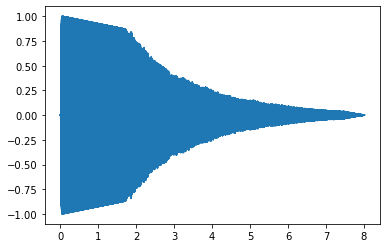

In [44]:
w_fast.plot()

In [45]:
w_fast.make_audio()

In [49]:
w_slow.make_audio()

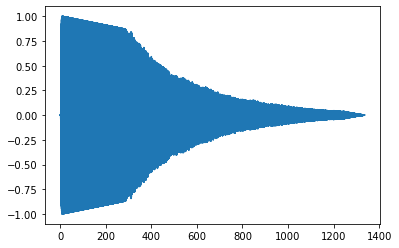

In [47]:
w_slow.plot()

In [ ]:
# Ускоренный звук приятние оригинала, а вот замедленный, крайне сильно режет ухо.